In [2]:
import torch
import torchvision
import torchvision.transforms as transforms


In [5]:
torch.cuda.is_available()

True

 deer  deer plane  frog


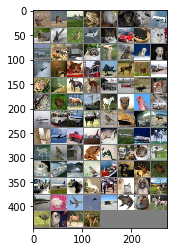

In [93]:
import matplotlib.pyplot as plt
import numpy as np

# functions to show an image


def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))


# get some random training images
dataiter = iter(trainloader)
images, labels = dataiter.next()

# show images
imshow(torchvision.utils.make_grid(images))
# print labels
print(' '.join('%5s' % classes[labels[j]] for j in range(4)))



In [1]:
import torch
import torchvision
import torchvision.transforms as transforms

import torch.nn as nn
import torch.nn.functional as F

transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
])

trainset = torchvision.datasets.STL10(root='./data', split='train', download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64, shuffle=True)

testset = torchvision.datasets.STL10(root='./data', split='test', download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=64, shuffle=False)

Files already downloaded and verified
Files already downloaded and verified


In [2]:


class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv = nn.Sequential(
            #3 224 128
            nn.Conv2d(3, 64, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(64, 64, 3, padding=1),nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),
            #64 112 64
            nn.Conv2d(64, 128, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(128, 128, 3, padding=1),nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),
            #128 56 32
            nn.Conv2d(128, 256, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(256, 256, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(256, 256, 3, padding=1),nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),
            #256 28 16
            nn.Conv2d(256, 512, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(512, 512, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(512, 512, 3, padding=1),nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2),
            #512 20 8
            nn.Conv2d(512, 512, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(512, 512, 3, padding=1),nn.LeakyReLU(0.2),
            nn.Conv2d(512, 512, 3, padding=1),nn.LeakyReLU(0.2),
            nn.MaxPool2d(2, 2)
        )
        #512 10 4

        self.avg_pool = nn.AvgPool2d(7)
        #512 1 1
        self.classifier = nn.Linear(512, 10)
        """
        self.fc1 = nn.Linear(512*2*2,4096)
        self.fc2 = nn.Linear(4096,4096)
        self.fc3 = nn.Linear(4096,10)
        """

    def forward(self, x):
        
        #print(x.size())
        features = self.conv(x)
        #print(features.size())
        x = self.avg_pool(features)
        #print(avg_pool.size())
        x = x.view(features.size(0), -1)
        #print(flatten.size())
        x = self.classifier(x)
        #x = self.softmax(x)
        return x, features

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

net = Net()
net = net.to(device)
param = list(net.parameters())
print(len(param))
for i in param:
    print(i.shape)
#print(param[0].shape)

28
torch.Size([64, 3, 3, 3])
torch.Size([64])
torch.Size([64, 64, 3, 3])
torch.Size([64])
torch.Size([128, 64, 3, 3])
torch.Size([128])
torch.Size([128, 128, 3, 3])
torch.Size([128])
torch.Size([256, 128, 3, 3])
torch.Size([256])
torch.Size([256, 256, 3, 3])
torch.Size([256])
torch.Size([256, 256, 3, 3])
torch.Size([256])
torch.Size([512, 256, 3, 3])
torch.Size([512])
torch.Size([512, 512, 3, 3])
torch.Size([512])
torch.Size([512, 512, 3, 3])
torch.Size([512])
torch.Size([512, 512, 3, 3])
torch.Size([512])
torch.Size([512, 512, 3, 3])
torch.Size([512])
torch.Size([512, 512, 3, 3])
torch.Size([512])
torch.Size([10, 512])
torch.Size([10])


In [13]:
classes =  ('airplance', 'bird', 'car', 'cat', 'deer', 'dog', 'horse', 'monkey', 'ship', 'truck')
import torch.optim as optim

criterion = nn.CrossEntropyLoss().cuda()
optimizer = optim.Adam(net.parameters(),lr=0.00001)

In [14]:
for epoch in range(100):  # loop over the dataset multiple times
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs
        inputs, labels = data
        inputs, labels = inputs.to(device), labels.to(device)
        # zero the parameter gradients
        optimizer.zero_grad()

        #print(inputs.shape)
        #print(inputs.shape)  
        # forward + backward + optimize
        outputs,f = net(inputs)
        #print(outputs.shape)
        #print(labels.shape)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        if(loss.item() > 1000):
            print(loss.item())
            for param in net.parameters():
                print(param.data)
        # print statistics
        running_loss += loss.item()
        if i % 50 == 49:    # print every 2000 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 50))
            running_loss = 0.0

print('Finished Training')

class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))
with torch.no_grad():
    for data in testloader:
        images, labels = data
        images = images.cuda()
        labels = labels.cuda()
        outputs,_ = net(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(4):
            label = labels[i]
            class_correct[label] += c[i].item()
            class_total[label] += 1


for i in range(10):
    print('Accuracy of %5s : %2d %%' % (
        classes[i], 100 * class_correct[i] / class_total[i]))

[1,    50] loss: 0.001
[2,    50] loss: 0.001
[3,    50] loss: 0.001
[4,    50] loss: 0.000
[5,    50] loss: 0.000
[6,    50] loss: 0.000
[7,    50] loss: 0.000
[8,    50] loss: 0.000
[9,    50] loss: 0.000
[10,    50] loss: 0.000


KeyboardInterrupt: 

Files already downloaded and verified
Files already downloaded and verified
[1,   100] loss: 1.799
[1,   200] loss: 1.791
[2,   100] loss: 1.782
[2,   200] loss: 1.772
[3,   100] loss: 1.764
[3,   200] loss: 1.764
[4,   100] loss: 1.758
[4,   200] loss: 1.746
[5,   100] loss: 1.741
[5,   200] loss: 1.739
[6,   100] loss: 1.735
[6,   200] loss: 1.718
[7,   100] loss: 1.720
[7,   200] loss: 1.706
[8,   100] loss: 1.709
[8,   200] loss: 1.695
[9,   100] loss: 1.697
[9,   200] loss: 1.683
[10,   100] loss: 1.682
[10,   200] loss: 1.672
Finished Training
Accuracy of plane : 40 %
Accuracy of   car : 70 %
Accuracy of  bird :  0 %
Accuracy of   cat : 17 %
Accuracy of  deer : 11 %
Accuracy of   dog : 46 %
Accuracy of  frog : 54 %
Accuracy of horse : 62 %
Accuracy of  ship : 36 %
Accuracy of truck : 71 %

In [15]:
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))
with torch.no_grad():
    for data in testloader:
        images, labels = data
        images = images.cuda()
        labels = labels.cuda()
        outputs, f = net(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(4):
            label = labels[i]
            class_correct[label] += c[i].item()
            class_total[label] += 1


for i in range(10):
    print('Accuracy of %5s : %2d %%' % (
        classes[i], 100 * class_correct[i] / class_total[i]))

Accuracy of airplance : 55 %
Accuracy of  bird : 54 %
Accuracy of   car : 84 %
Accuracy of   cat : 52 %
Accuracy of  deer : 59 %
Accuracy of   dog : 49 %
Accuracy of horse : 66 %
Accuracy of monkey : 66 %
Accuracy of  ship : 84 %
Accuracy of truck : 65 %


In [16]:
torch.save(net, 'vgg19.pt')

/lvmdata/ees/anaconda3/envs/tensorflow35/lib/python3.5/site-packages/torch/serialization.py:241: UserWarning: Couldn't retrieve source code for container of type Net. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


In [17]:
net2 = torch.load('vgg19.pt')

In [18]:
net2 = net2.to(device)

In [19]:
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))
with torch.no_grad():
    for data in testloader:
        images, labels = data
        images = images.cuda()
        labels = labels.cuda()
        outputs, f = net2(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(4):
            label = labels[i]
            class_correct[label] += c[i].item()
            class_total[label] += 1


for i in range(10):
    print('Accuracy of %5s : %2d %%' % (
        classes[i], 100 * class_correct[i] / class_total[i]))

Accuracy of airplance : 55 %
Accuracy of  bird : 54 %
Accuracy of   car : 84 %
Accuracy of   cat : 52 %
Accuracy of  deer : 59 %
Accuracy of   dog : 49 %
Accuracy of horse : 66 %
Accuracy of monkey : 66 %
Accuracy of  ship : 84 %
Accuracy of truck : 65 %


In [33]:
params = list(net.parameters())

In [61]:

import matplotlib.pyplot as plt

In [81]:
import numpy as np
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    
for data in testloader:    
    images, labels = data
    images = images.cuda()
    labels = labels.cuda()
    outputs, f = net(images)
    _, predicted = torch.max(outputs, 1)
    break

ANS : horse  REAL : horse 0
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


/lvmdata/ees/anaconda3/envs/tensorflow35/lib/python3.5/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/lvmdata/ees/anaconda3/envs/tensorflow35/lib/python3.5/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


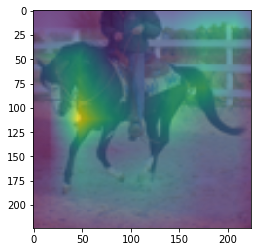

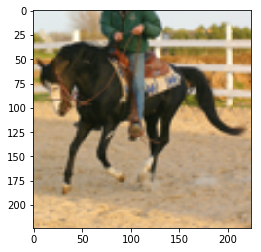

ANS : monkey  REAL : monkey 1
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


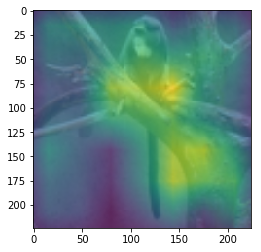

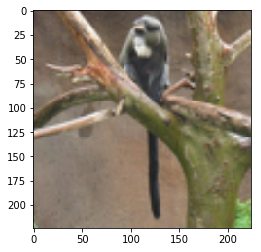

ANS : dog  REAL : dog 2
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


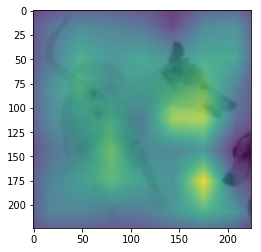

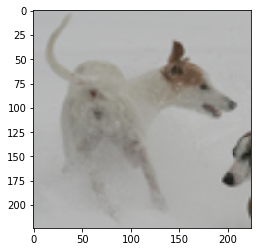

ANS : ship  REAL : airplance 3
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


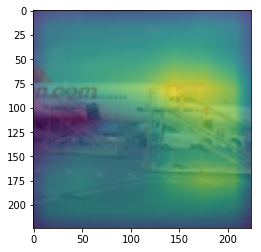

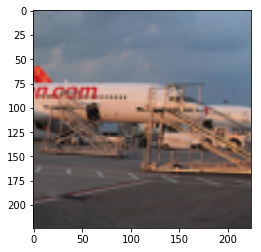

ANS : cat  REAL : cat 4
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


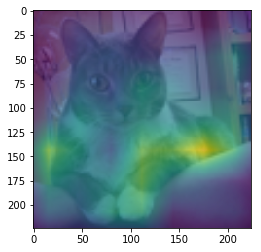

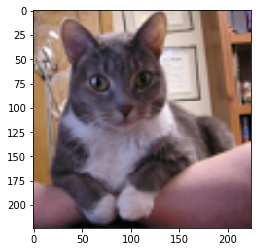

ANS : bird  REAL : bird 5
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


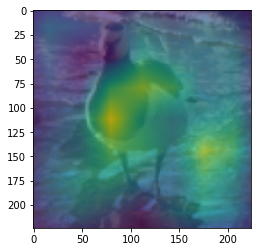

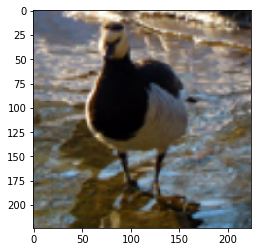

ANS : horse  REAL : bird 6
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


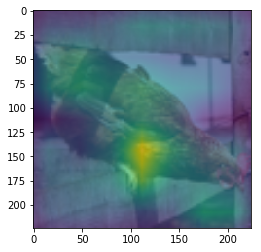

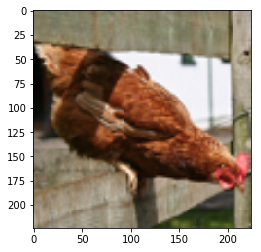

ANS : bird  REAL : bird 7
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


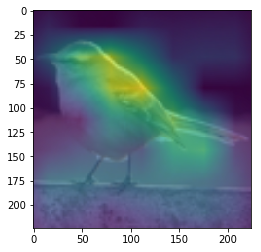

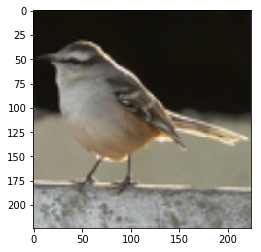

ANS : deer  REAL : deer 8
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


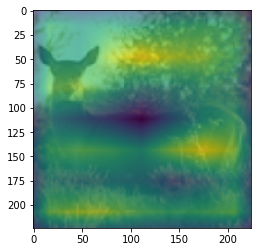

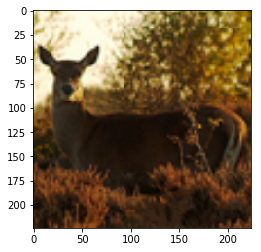

ANS : horse  REAL : deer 9
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


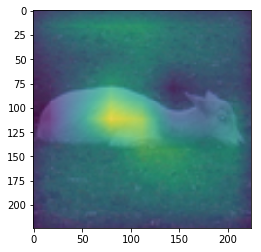

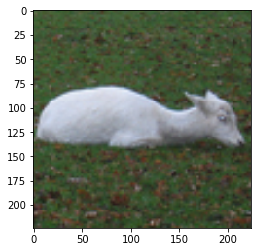

ANS : bird  REAL : airplance 10
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


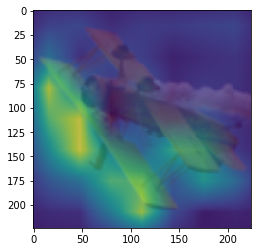

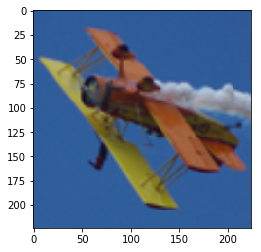

ANS : airplance  REAL : airplance 11
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


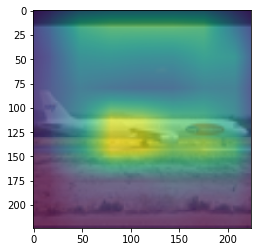

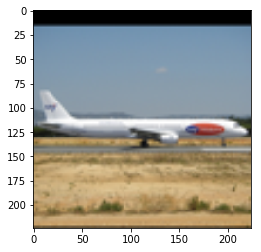

ANS : deer  REAL : deer 12
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


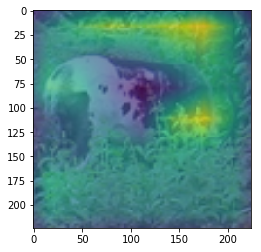

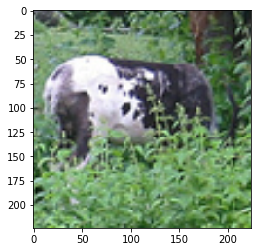

ANS : airplance  REAL : airplance 13
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


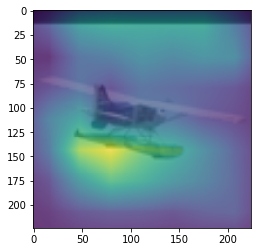

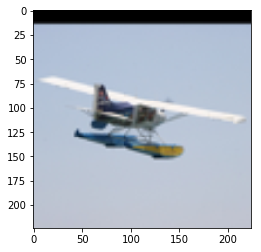

ANS : cat  REAL : bird 14
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


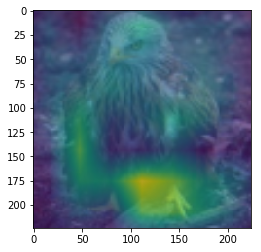

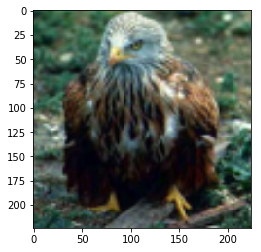

ANS : cat  REAL : dog 15
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


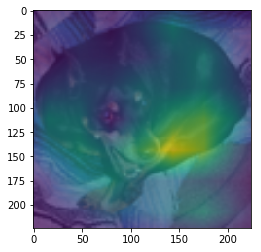

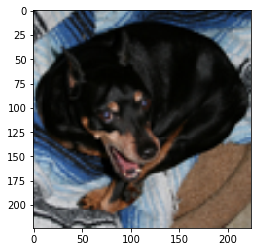

ANS : deer  REAL : deer 16
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


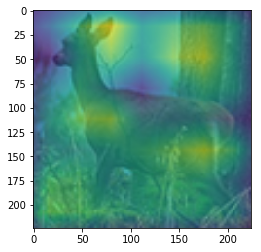

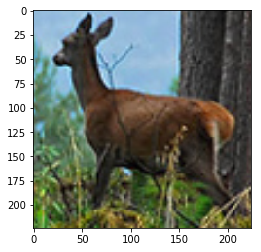

ANS : truck  REAL : truck 17
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


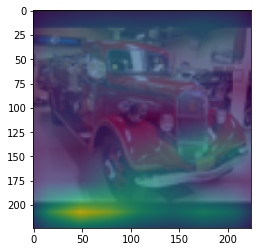

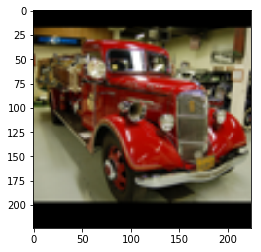

ANS : airplance  REAL : airplance 18
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


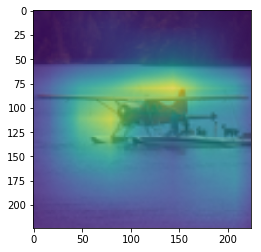

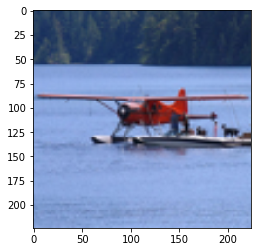

ANS : horse  REAL : horse 19
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


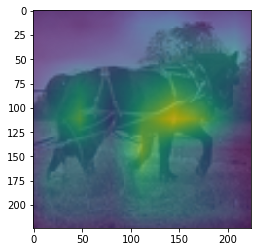

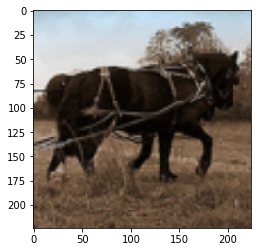

ANS : horse  REAL : dog 20
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


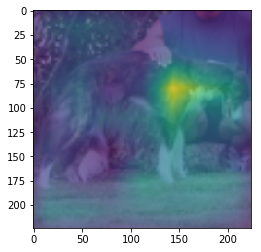

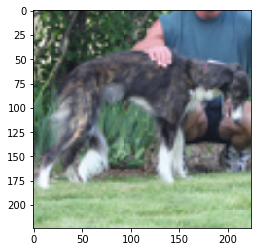

ANS : cat  REAL : cat 21
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


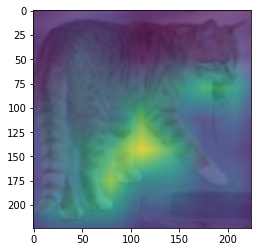

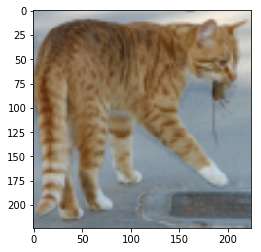

ANS : dog  REAL : bird 22
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


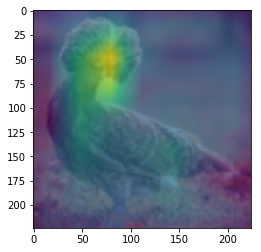

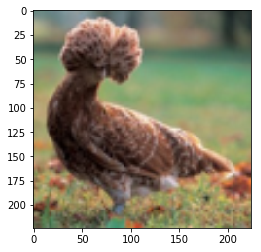

ANS : cat  REAL : cat 23
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


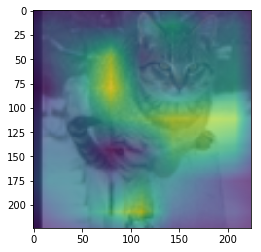

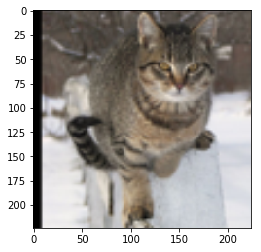

ANS : car  REAL : car 24
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


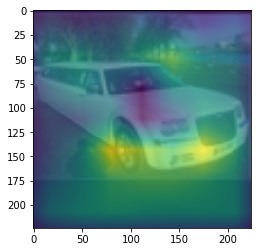

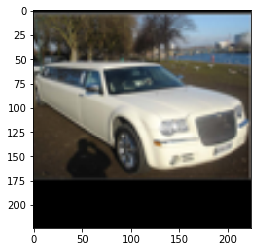

ANS : horse  REAL : horse 25
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


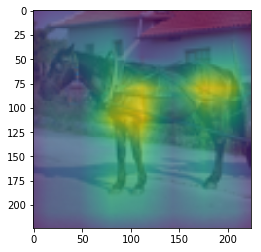

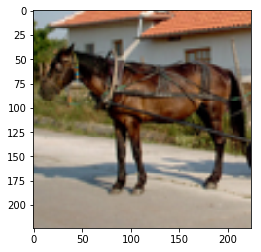

ANS : bird  REAL : dog 26
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


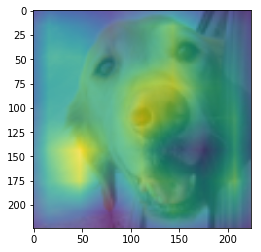

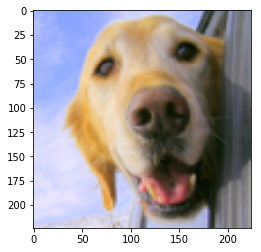

ANS : cat  REAL : dog 27
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


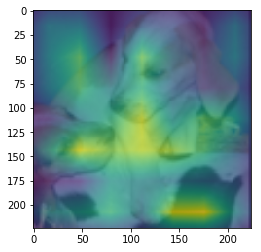

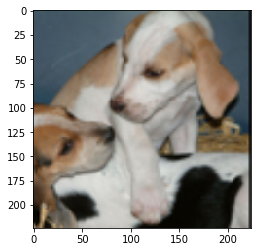

ANS : truck  REAL : car 28
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


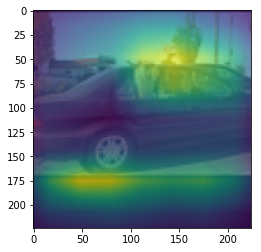

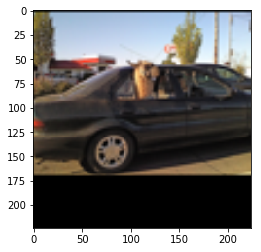

ANS : dog  REAL : monkey 29
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


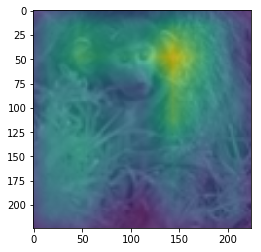

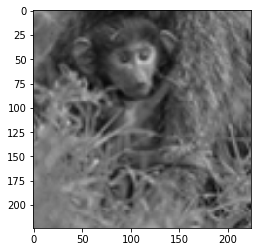

ANS : truck  REAL : bird 30
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


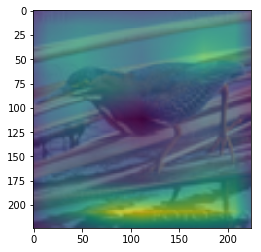

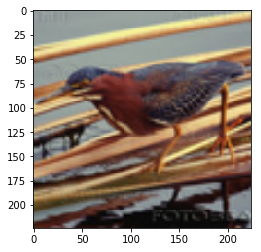

ANS : horse  REAL : horse 31
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


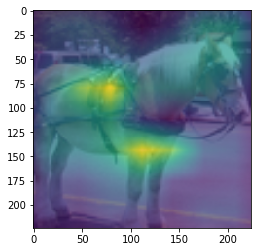

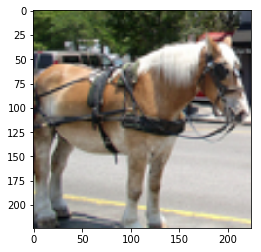

ANS : dog  REAL : cat 32
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


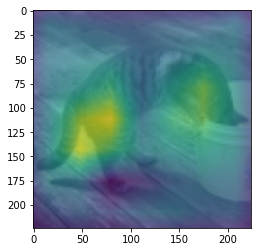

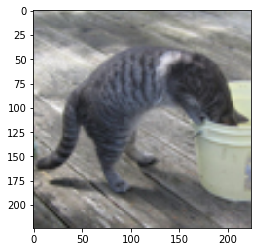

ANS : monkey  REAL : monkey 33
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


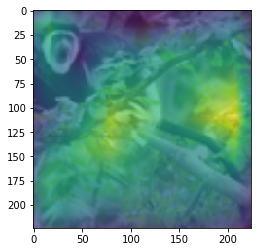

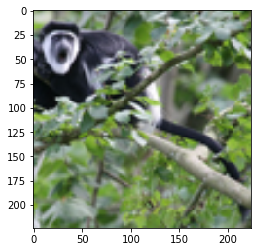

ANS : truck  REAL : truck 34
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


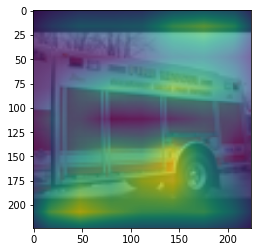

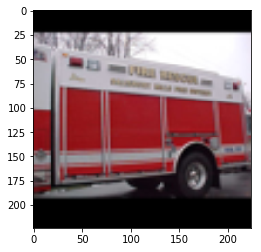

ANS : truck  REAL : car 35
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


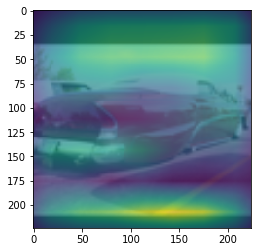

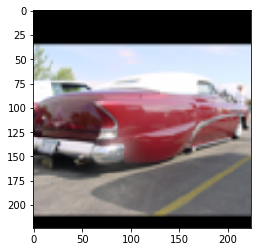

ANS : deer  REAL : deer 36
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


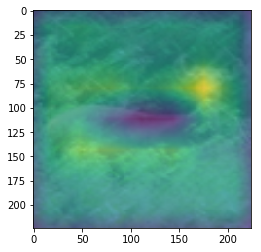

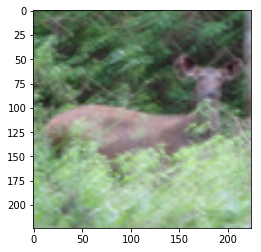

ANS : monkey  REAL : monkey 37
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


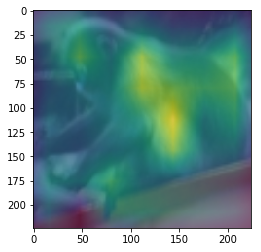

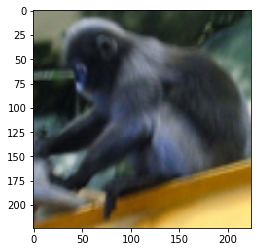

ANS : truck  REAL : truck 38
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


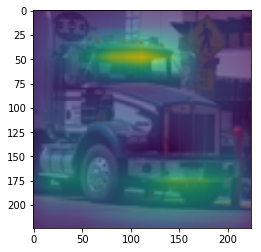

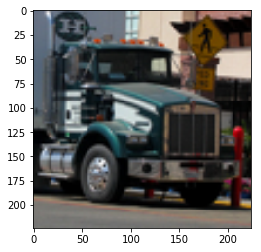

ANS : horse  REAL : dog 39
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


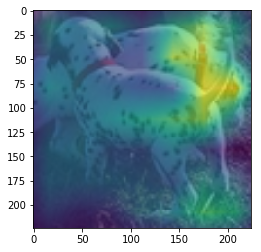

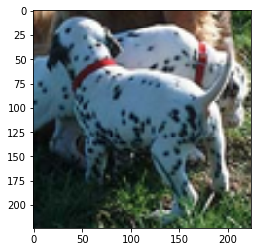

ANS : bird  REAL : bird 40
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


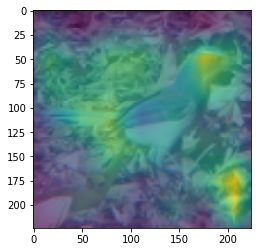

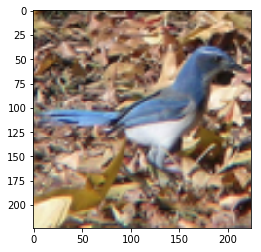

ANS : airplance  REAL : truck 41
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


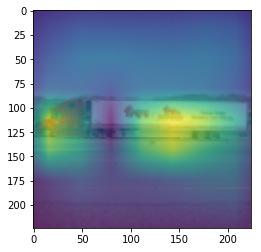

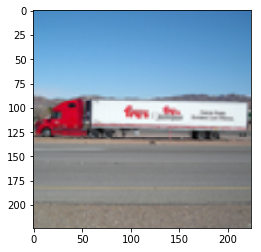

ANS : airplance  REAL : airplance 42
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


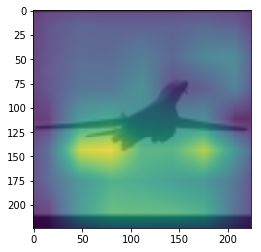

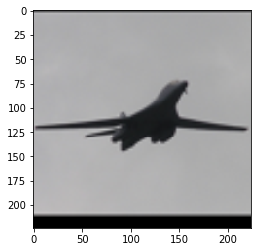

ANS : horse  REAL : horse 43
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


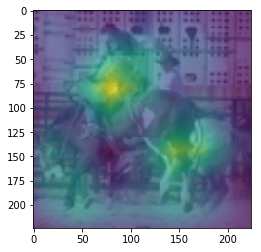

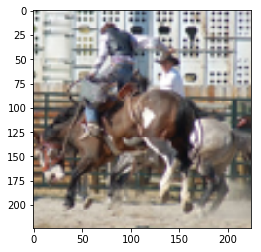

ANS : deer  REAL : deer 44
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


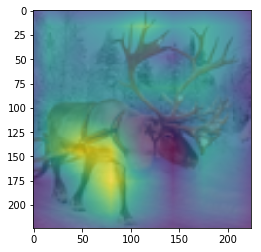

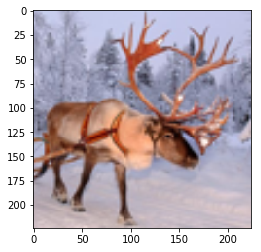

ANS : truck  REAL : truck 45
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


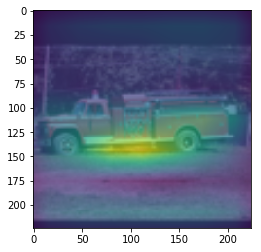

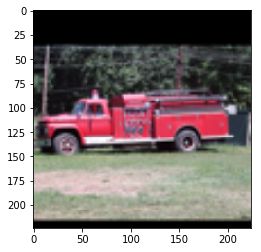

ANS : bird  REAL : bird 46
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


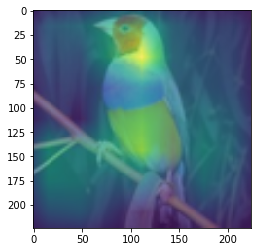

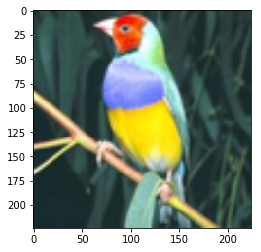

ANS : bird  REAL : bird 47
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


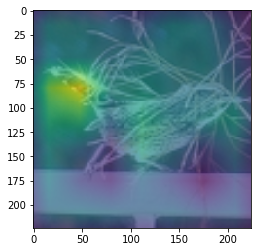

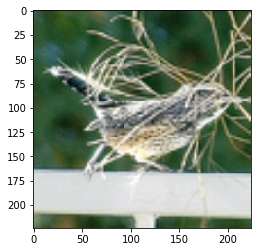

ANS : cat  REAL : cat 48
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


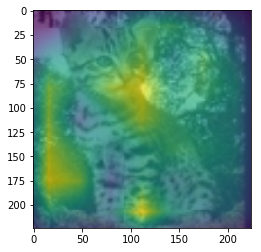

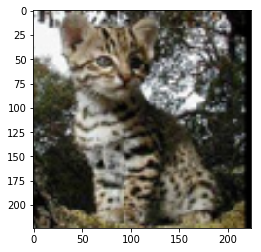

ANS : car  REAL : car 49
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


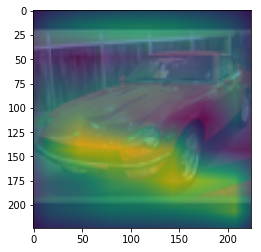

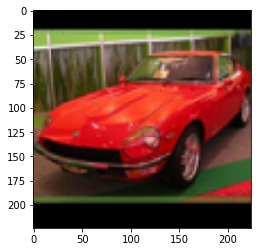

ANS : cat  REAL : dog 50
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


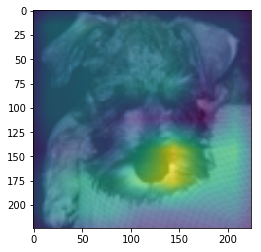

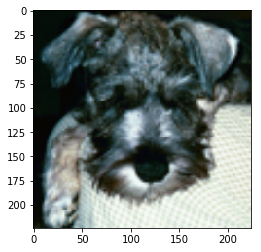

ANS : cat  REAL : deer 51
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


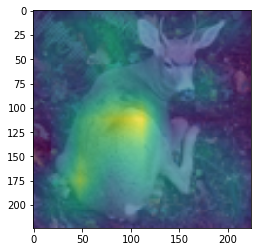

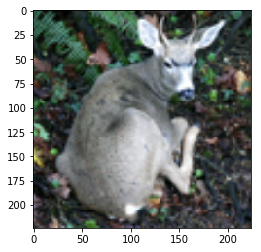

ANS : airplance  REAL : airplance 52
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


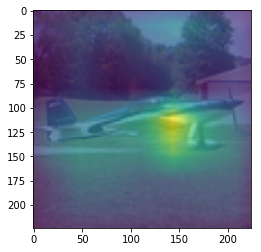

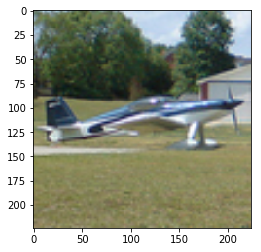

ANS : airplance  REAL : airplance 53
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


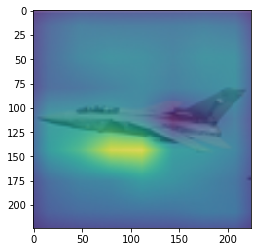

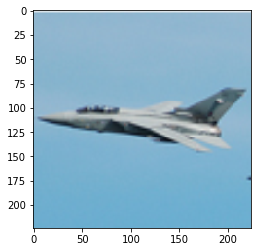

ANS : car  REAL : truck 54
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


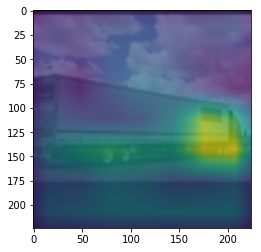

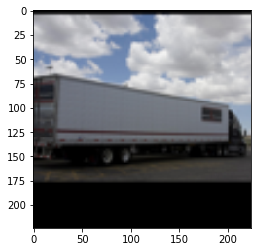

ANS : ship  REAL : ship 55
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


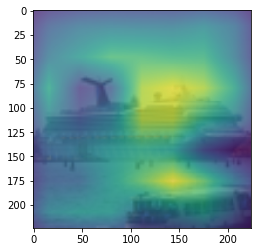

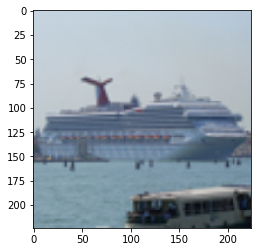

ANS : horse  REAL : horse 56
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


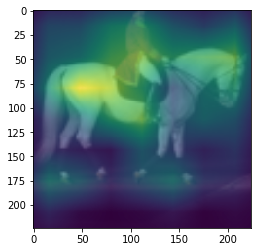

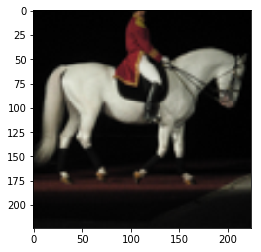

ANS : monkey  REAL : monkey 57
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


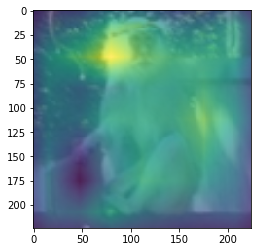

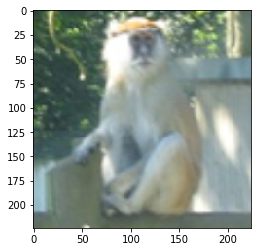

ANS : car  REAL : car 58
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


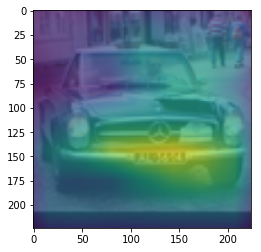

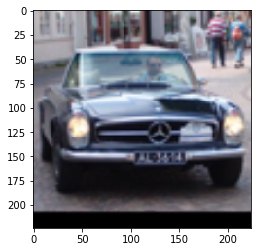

ANS : ship  REAL : airplance 59
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


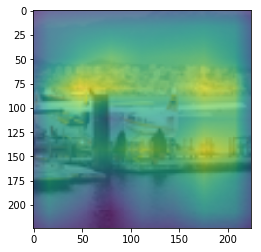

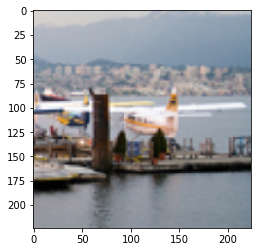

ANS : airplance  REAL : airplance 60
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


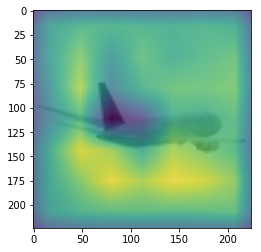

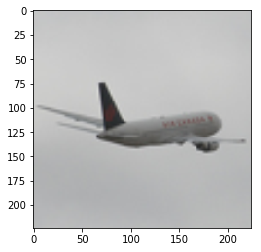

ANS : dog  REAL : bird 61
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


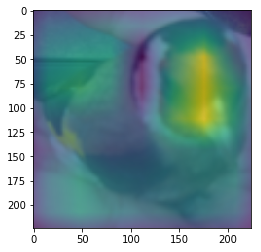

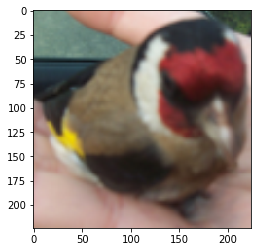

ANS : bird  REAL : bird 62
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


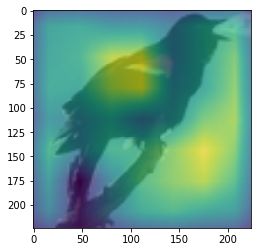

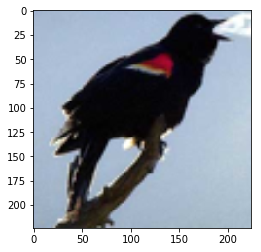

ANS : monkey  REAL : monkey 63
tensor([-11.1921, -16.2105, -16.5461, -29.0544,  17.0920,  26.8978,  63.5125,
         -9.7656, -68.6861,  -7.1515],
       device='cuda:0', grad_fn=<SelectBackward>)


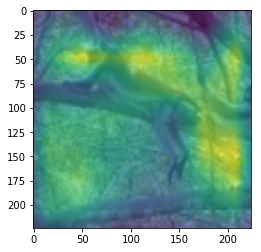

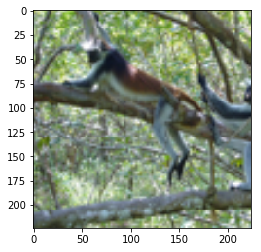

In [160]:
import skimage.transform
num = 0
for num in range(64):
    print("ANS :",classes[int(predicted[num])]," REAL :",classes[int(labels[num])],num)
    
    print(outputs[0])
    
    overlay = params[-2][int(predicted[num])].matmul(f[num].reshape(512,49)).reshape(7,7).cpu().data.numpy()

    overlay = overlay - np.min(overlay)
    overlay = overlay / np.max(overlay)

    imshow(images[num].cpu())
    skimage.transform.resize(overlay, [224,224])
    plt.imshow(skimage.transform.resize(overlay, [224,224]), alpha=0.7)
    plt.show()
    imshow(images[num].cpu())
    plt.show()
    
#plt.imshow(params[-2][int(predicted[num])].matmul(f[num].reshape(512,49)).reshape(7,7).cpu().data.numpy(), alpha=0.5,cmap='jet');